# Dataset Analysis

Skip to the BERT section if you want to see the actual model, this is us analyzing the dataset and different things

## Pip installs that may be necessary 
We ran the analysis on local jupyter notebooks, not sure about pip installs need for the analysis in Kaggle

In [1]:
#!pip install numpy
#!pip install matplotlib
#!pip install pandas
#!pip install seaborn
#!pip install scikit-learn
#!pip install wordcloud
#!pip install transformers
#!pip install textblob
#!pip install spacy
#!pip install imblearn
#!python -m spacy download en_core_web_sm

## Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import re
import string
from nltk.stem import WordNetLemmatizer

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB

import nltk
nltk.download('stopwords')
nltk.download('wordnet')

from collections import Counter

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Dataset Load

In [3]:
# this file path is for Kaggle, but we tested locally
data = pd.read_csv('/kaggle/input/train-set/train.txt', sep='\t', header=None, names=['Title', 'Origin', 'Genre', 'Director', 'Plot'])

print("Genre value counts")
print(data['Genre'].value_counts())

Genre value counts
Genre
drama        1676
comedy       1193
horror       1108
action       1059
romance       886
western       829
crime         541
animation     535
sci-fi        214
Name: count, dtype: int64


In [4]:
data.head()

,Title,Origin,Genre,Director,Plot
0,Ela Cheppanu,Telugu,romance,Ramana,Sekhar (Tarun) is a graduate from IIM and work...
1,A Nightmare on Elm Street,American,horror,Samuel Bayer,Kris Fowles (Katie Cassidy) goes to the Spring...
2,American Gothic,American,horror,John Hough,Cynthia is traumatized by the death of her bab...
3,Gang,Bollywood,crime,Mazhar Khan,"Four friends, Gangu (Jackie Shroff), Abdul (Na..."
4,Intimate Relations,British,drama,Charles Frank,Crisis in a middle-class family when the son f...


## Stop Words

In [5]:
stop_words = ["the", "to", "of", "a", 'and', 'is', 'his', 'in', 'he', 
            'that', 'her', "with", "by", "for", "him", "the", "as", "who",
            "on", "she", "but", "from", "has", "they", "an", "at", "their", "are",
            "into", "he", "out", "it", "up", "be", "was", "when", "not", "them", "which",
            "then", "after", "about", "where", "one", "have", "When", "After", "tells", "him.",
            "back", "She", "will", "while", "all", "two", "In", "had", "been", "They",
            "get", "only", "also", "before", "off", "being", "As", "goes", "takes",
            "this", "other", "take", "tries", "A", "her.", "go", "gets", "can", "man", "so",
            "over", "through", "down", "help", "new", "him,", "now", "comes", "next", "himself",
            "later", "however", "away", "there", "during", "both", "first", "again", "no", "way", "own",
            "some", "another", "more", "becomes", "make", "does", "what", "begins", "meanwhile", "just",
            "asks", "if", "because", "soon", "having", "its", "eventually", "come", "still", "between", "father",
            "finds", "house", "home", "find"
            ]

## Data Preprocessing
We did some experiments here (commented)

In [6]:
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub('\s+', ' ', text)
    text = re.sub(r"[^a-zA-Z]", " ", text)
    text = text.strip(' ')
    tokens = text.split()
    filtered = [word for word in tokens if word not in stop_words]
    return ' '.join(filtered)


def clean_text(text):
    text = text.lower()
    text = re.sub('[%s]' % re.escape(string.punctuation + string.digits), '', text)
    text = re.sub('\s+', ' ', text).strip()
    return text

def clean_text2(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "can not ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub('\s+', ' ', text)
    text = re.sub(r"[^a-zA-Z]", " ", text)
    text = text.strip(' ')
    return text

def tokenize_and_remove_stopwords(text):
    tokens = text.split()
    filtered = [word for word in tokens if word not in stop_words]
    return ' '.join(filtered)

def remove_stopwords(text):
    tokens = text.split()
    filtered = [word for word in tokens if word not in stop_words]
    return filtered

def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    tokens = text.split()
    lemmatized = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(lemmatized)

# cleaning, tokenizing and removing stopwords TODO does it make sense to tokenize?
# even if we tokenize, does it make sense to tokenize like I'm doing?
data['Clean_Plot'] = data['Plot'].apply(preprocess_text)

#data['Clean_Plot'] = data['Clean_Plot'].apply(tokenize_and_remove_stopwords)

# lemmatization -- TODO does it make sense to lemmatize? I think not
#data['Clean_Plot'] = data['Clean_Plot'].apply(lemmatize_text)

## Writes the Clean Plot to a file for later use

In [7]:
# # write to txt the data['Clean_Plot']
# data['Clean_Plot'].to_csv('datasets/clean_plot_with_nonalpha.txt', index=False)

# print(data.head())

## Check Genre Distribution

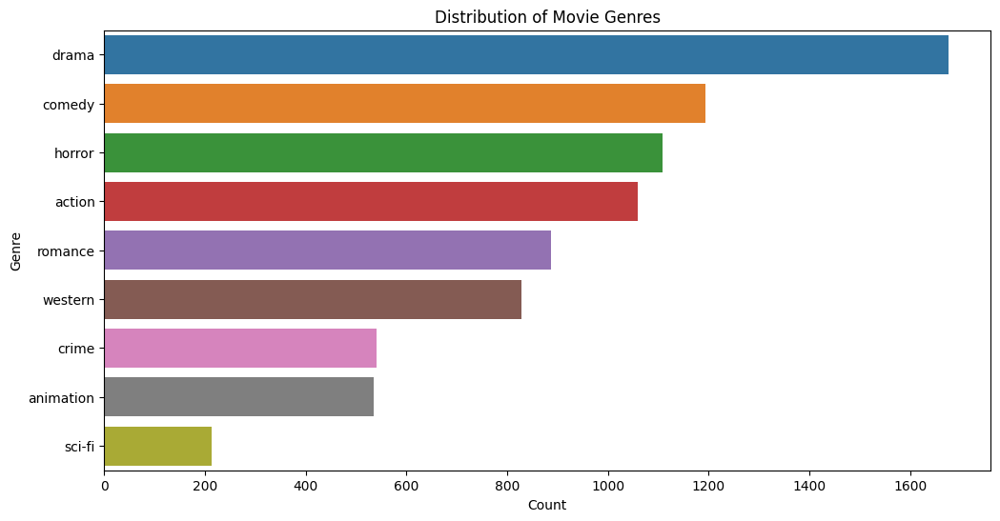

In [8]:
plt.figure(figsize=(12,6))
sns.countplot(y='Genre', data=data, order=data['Genre'].value_counts().index)
plt.title('Distribution of Movie Genres')
plt.xlabel('Count')
plt.ylabel('Genre')
plt.show()

## Word Cloud for Genres

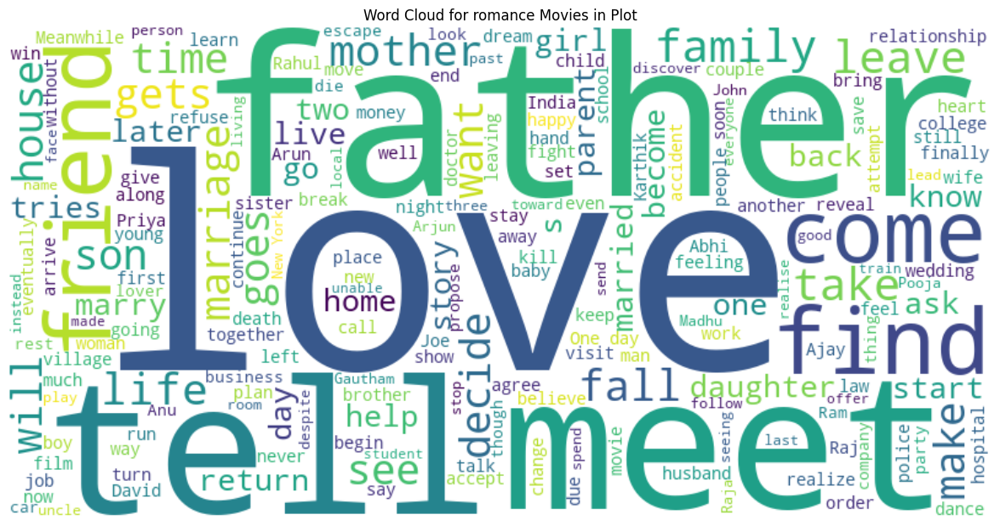

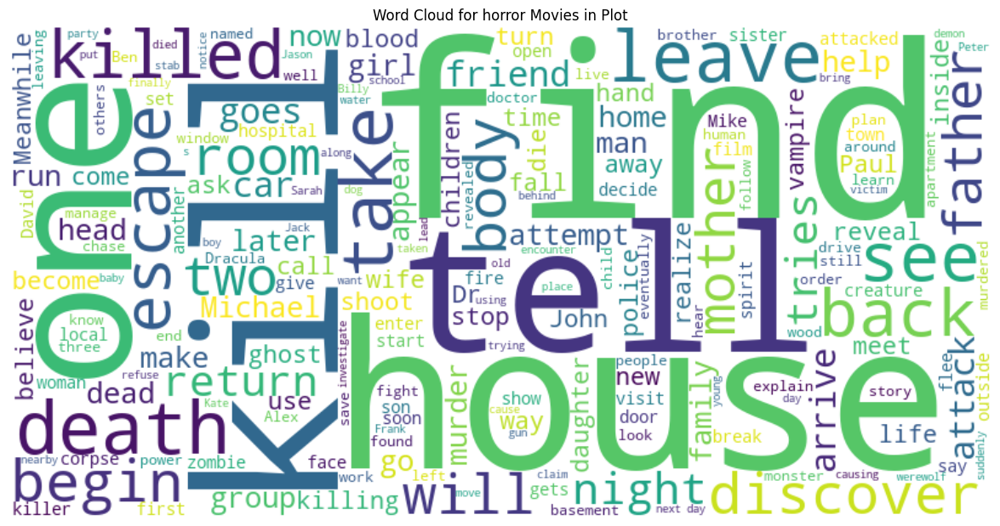

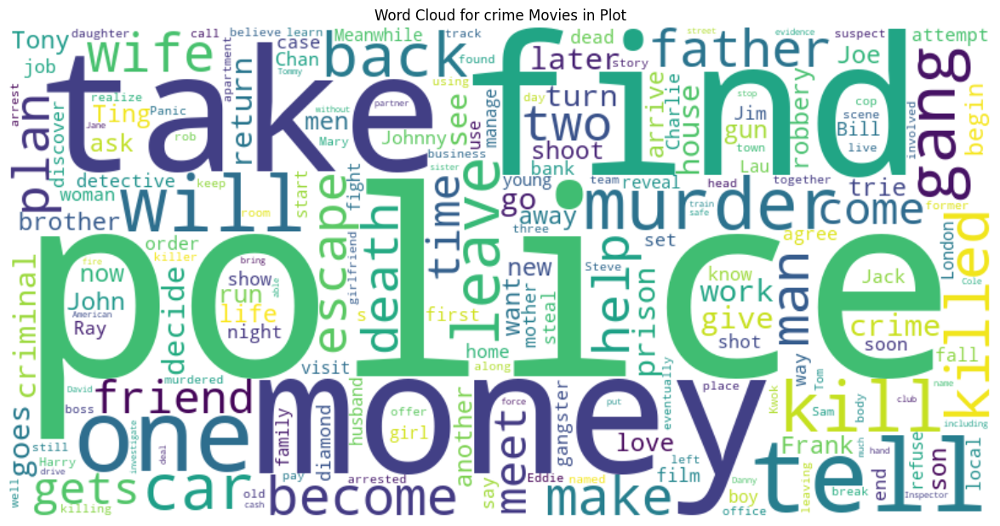

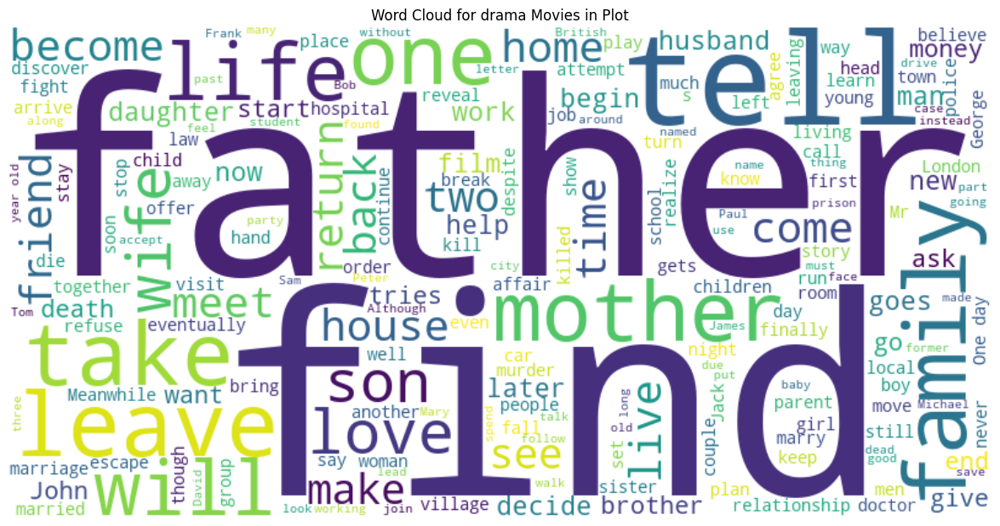

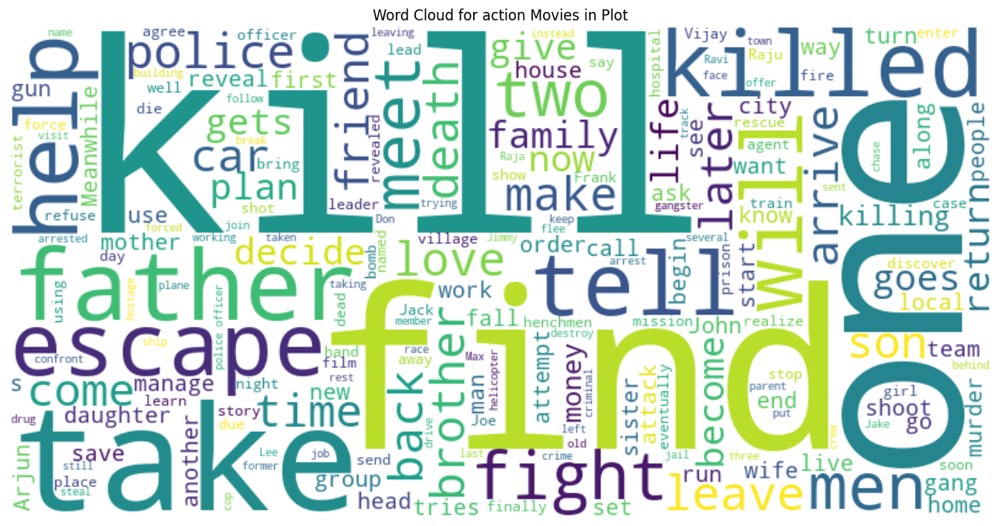

...

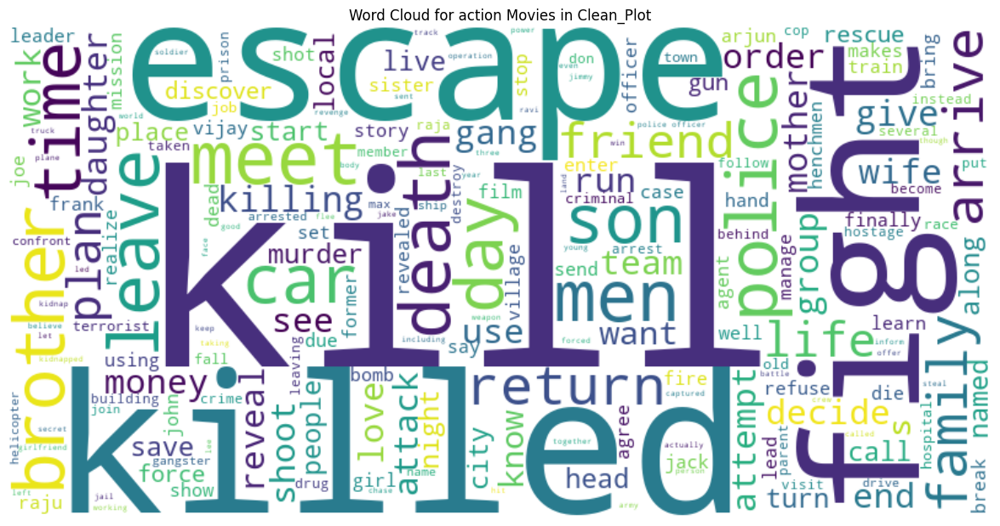

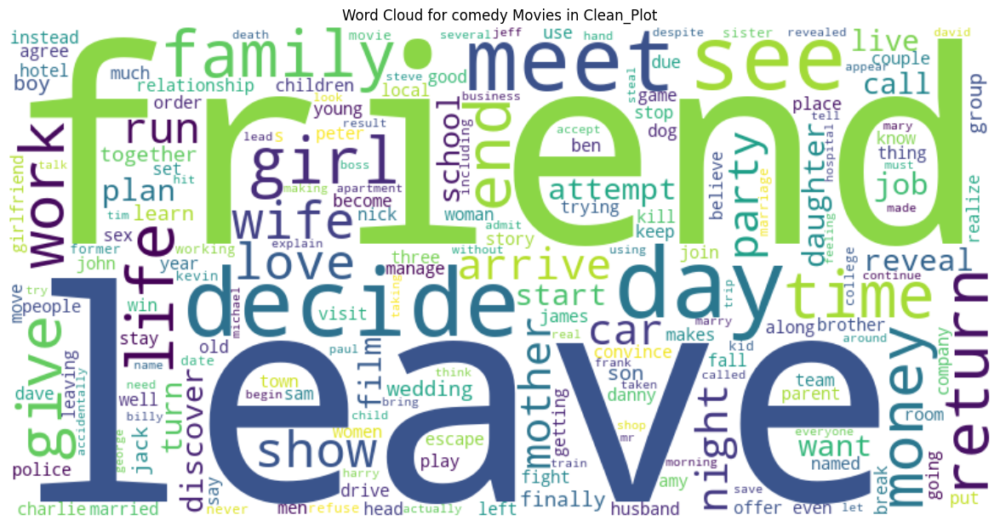

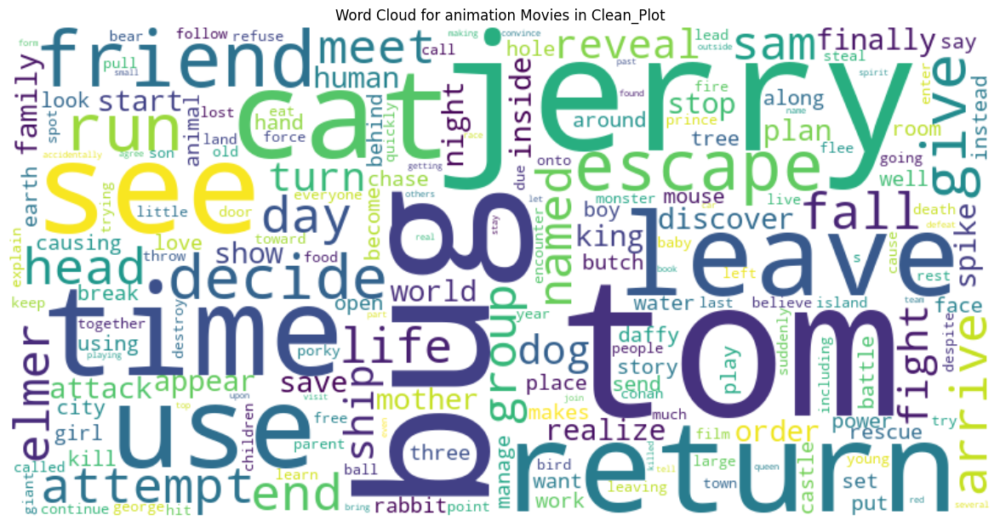

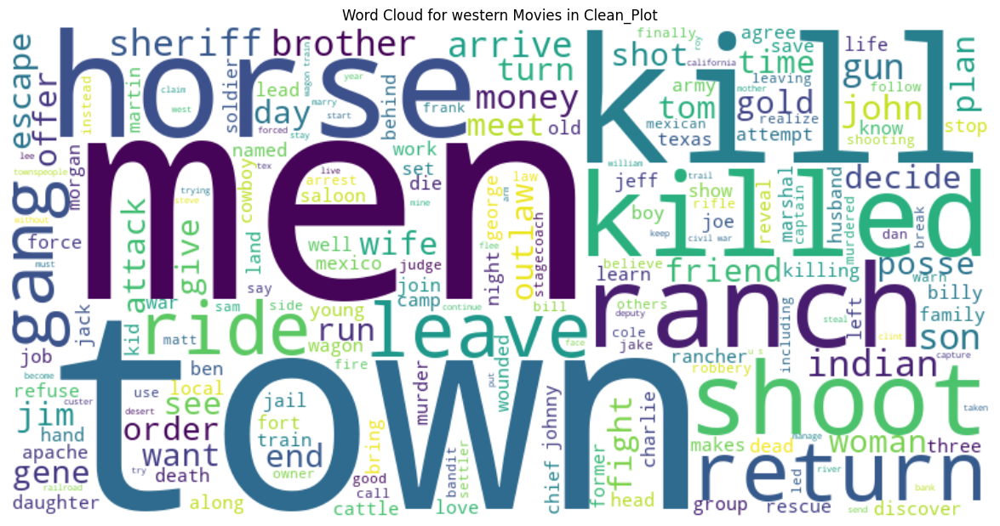

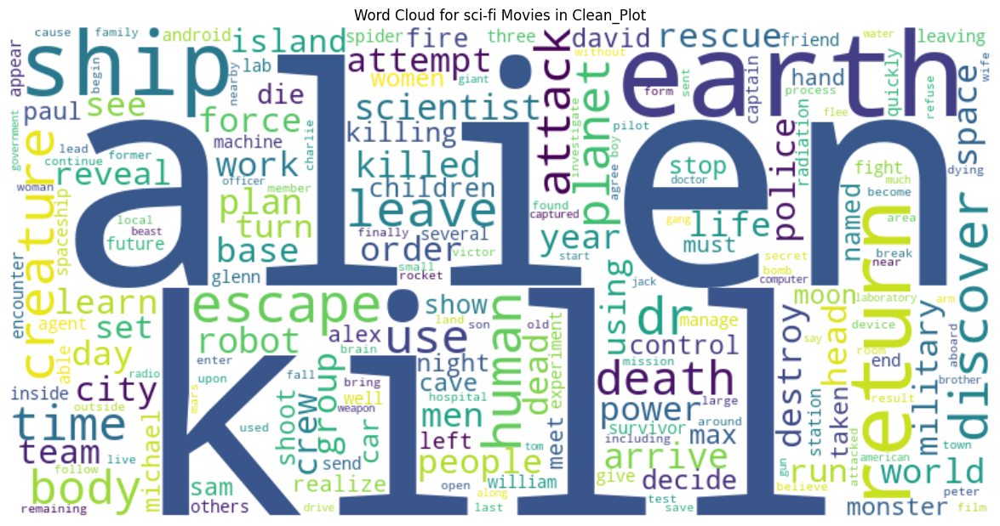

In [9]:
from wordcloud import WordCloud

def generate_wordcloud(key):
   genres = data['Genre'].unique()
   for genre in genres:
       text = ' '.join(data[data['Genre'] == genre][key])
       wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
       plt.figure(figsize=(15, 7.5))
       plt.imshow(wordcloud, interpolation='bilinear')
       plt.title(f'Word Cloud for {genre} Movies in {key}')
       plt.axis('off')
       plt.show()

generate_wordcloud('Plot') # before removing stop words
generate_wordcloud('Clean_Plot') # after removing stop words

## Most frequent words for genre (Not word cloud)

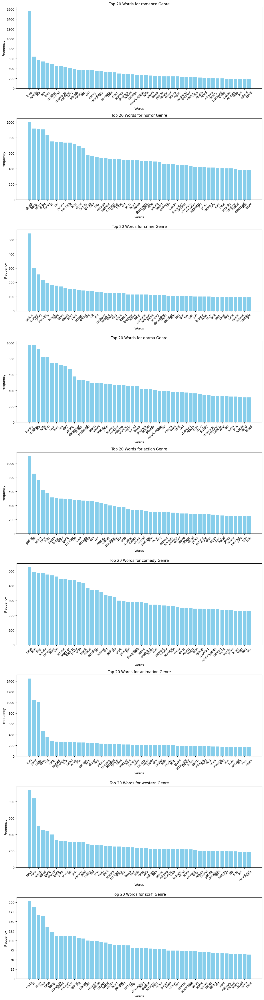

                       Title     Origin    Genre       Director  \
0               Ela Cheppanu     Telugu  romance         Ramana   
1  A Nightmare on Elm Street   American   horror   Samuel Bayer   
2            American Gothic   American   horror     John Hough   
3                       Gang  Bollywood    crime    Mazhar Khan   
4         Intimate Relations    British    drama  Charles Frank   

                                                Plot  \
0  Sekhar (Tarun) is a graduate from IIM and work...   
1  Kris Fowles (Katie Cassidy) goes to the Spring...   
2  Cynthia is traumatized by the death of her bab...   
3  Four friends, Gangu (Jackie Shroff), Abdul (Na...   
4  Crisis in a middle-class family when the son f...   

                                          Clean_Plot  romance_unique_words  \
0  sekhar tarun graduate iim works business manag...                     4   
1  kris fowles katie cassidy springwood diner mee...                    15   
2  cynthia traumatized dea

In [10]:
# to get them
def get_top_words_by_genre(key, num_top_words=50):
    genres = data['Genre'].unique()
    top_words_by_genre = {}

    for genre in genres:
        genre_data = data[data['Genre'] == genre][key]

        vectorizer = CountVectorizer(stop_words='english')
        genre_matrix = vectorizer.fit_transform(genre_data)

        word_freq = pd.DataFrame(genre_matrix.toarray(), columns=vectorizer.get_feature_names_out()).sum(axis=0)
        
        top_words = word_freq.nlargest(num_top_words)
        top_words_by_genre[genre] = top_words

    return top_words_by_genre

# to visualize them
def plot_top_words_by_genre(top_words_by_genre, num_top_words=20):
    genres = data['Genre'].unique()
    plt.figure(figsize=(12, len(genres) * 5))

    for idx, genre in enumerate(genres):
        top_words = top_words_by_genre[genre]

        plt.subplot(len(genres), 1, idx + 1)
        plt.bar(top_words.index, top_words.values, color='skyblue')
        plt.title(f'Top {num_top_words} Words for {genre} Genre')
        plt.xlabel('Words')
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

top_words_by_genre = get_top_words_by_genre('Clean_Plot')
plot_top_words_by_genre(top_words_by_genre)

# add unique words as a new feature for each genre
def add_unique_words(data, top_words_by_genre):
    for genre in data['Genre'].unique():
        data[f'{genre}_unique_words'] = data['Clean_Plot'].apply(lambda x: len(set(x.split()) & set(top_words_by_genre[genre].index)))
    

add_unique_words(data, top_words_by_genre)
print(data.head())

## Plot length distribution

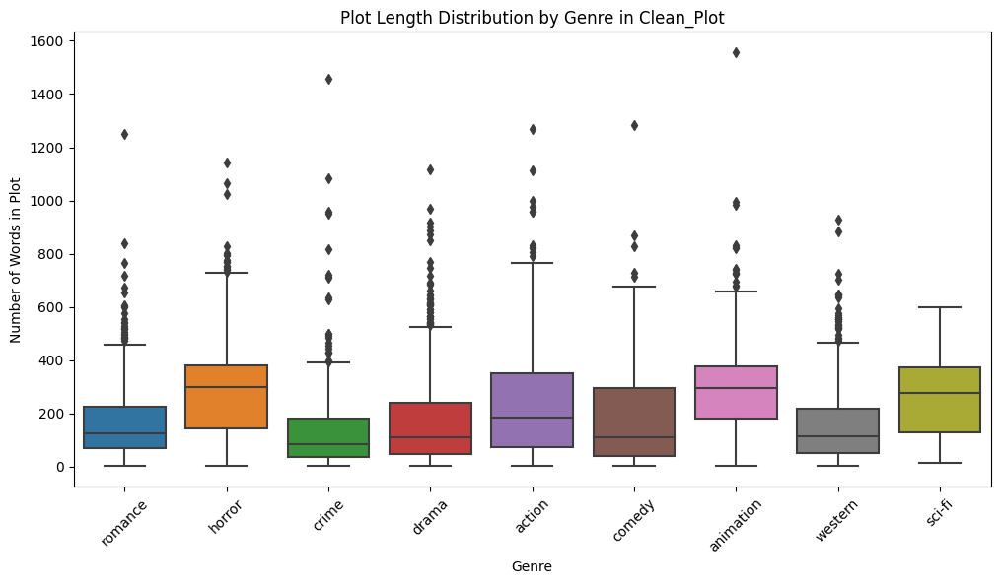

            count        mean         std   min     25%    50%     75%     max
Genre                                                                         
action     1059.0  221.605288  173.184848   3.0   74.50  183.0  352.00  1270.0
animation   535.0  291.409346  169.181303   2.0  180.00  294.0  377.50  1556.0
comedy     1193.0  171.545683  160.179675   3.0   39.00  111.0  295.00  1285.0
crime       541.0  132.212569  152.499342   4.0   36.00   83.0  179.00  1456.0
drama      1676.0  160.877685  149.758827   3.0   47.00  109.0  239.25  1117.0
horror     1108.0  279.981047  165.650012   4.0  145.25  299.5  379.25  1144.0
romance     886.0  161.262980  130.981034   3.0   68.00  124.0  225.50  1249.0
sci-fi      214.0  257.098131  142.023851  15.0  128.75  277.0  372.00   599.0
western     829.0  158.365501  140.063582   4.0   53.00  116.0  219.00   930.0
1556


In [11]:
def plot_length(key):
    data['Plot_Length'] = data[key].apply(lambda x: len(x.split()))
    plt.figure(figsize=(12,6))
    sns.boxplot(x='Genre', y='Plot_Length', data=data)
    plt.title(f'Plot Length Distribution by Genre in {key}')
    plt.xlabel('Genre')
    plt.ylabel('Number of Words in Plot')
    plt.xticks(rotation=45)
    plt.show()
    print(data.groupby('Genre')['Plot_Length'].describe())

plot_length('Clean_Plot')

def max_plot_length():
    max_length = 0
    for plot in data['Clean_Plot']:
        length = len(plot.split())
        max_length = max(max_length, length)
    return max_length

print(max_plot_length())

## Frequency Analysis of Words in global plot

[('love', 3977), ('time', 3798), ('family', 3757), ('police', 3653), ('life', 3586), ('mother', 3409), ('day', 3225), ('killed', 3003), ('film', 2961), ('wife', 2916), ('night', 2861), ('death', 2858), ('s', 2811), ('kill', 2741), ('son', 2716), ('men', 2676), ('friend', 2523), ('car', 2492), ('tom', 2448), ('young', 2430), ('daughter', 2426), ('money', 2418), ('leave', 2412), ('leaves', 2401), ('old', 2375), ('town', 2358), ('friends', 2306), ('decides', 2222), ('returns', 2146), ('years', 2136), ('brother', 2134), ('escape', 2101), ('woman', 2076), ('john', 2055), ('girl', 2001), ('kills', 1974), ('named', 1969), ('meets', 1933), ('room', 1920), ('arrives', 1919), ('group', 1909), ('dead', 1880), ('return', 1878), ('sees', 1861), ('story', 1854), ('see', 1836), ('three', 1833), ('do', 1809), ('would', 1798), ('each', 1791), ('school', 1785), ('body', 1777), ('falls', 1754), ('fight', 1744), ('finally', 1740), ('gang', 1722), ('reveals', 1690), ('head', 1679), ('wants', 1654), ('like'

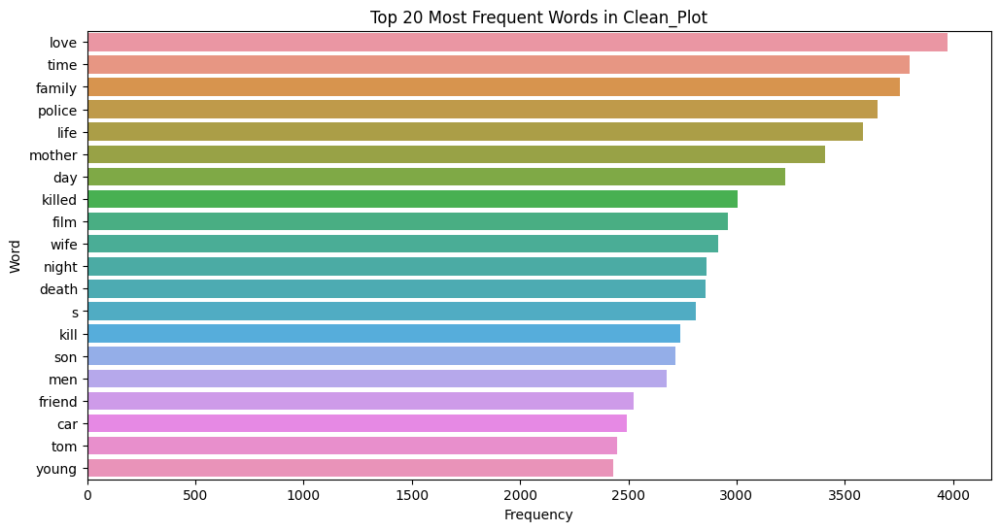

In [12]:
def freq_analysis(key):
    # print the top 100 most frequent words
    all_words = ' '.join(data[key]).split()
    word_freq = Counter(all_words)
    common_words = word_freq.most_common(100)
    print(common_words)

    # plot the top 20 most frequent words
    all_words = ' '.join(data[key]).split()
    word_freq = Counter(all_words)
    common_words = word_freq.most_common(20)
    df_common_words = pd.DataFrame(common_words, columns=['Word', 'Frequency'])

    plt.figure(figsize=(12,6))
    sns.barplot(x='Frequency', y='Word', data=df_common_words)
    plt.title(f'Top 20 Most Frequent Words in {key}')
    plt.xlabel('Frequency')
    plt.ylabel('Word')
    plt.show()
    
freq_analysis('Clean_Plot')

## Term frequency heatmap
For top 20 words

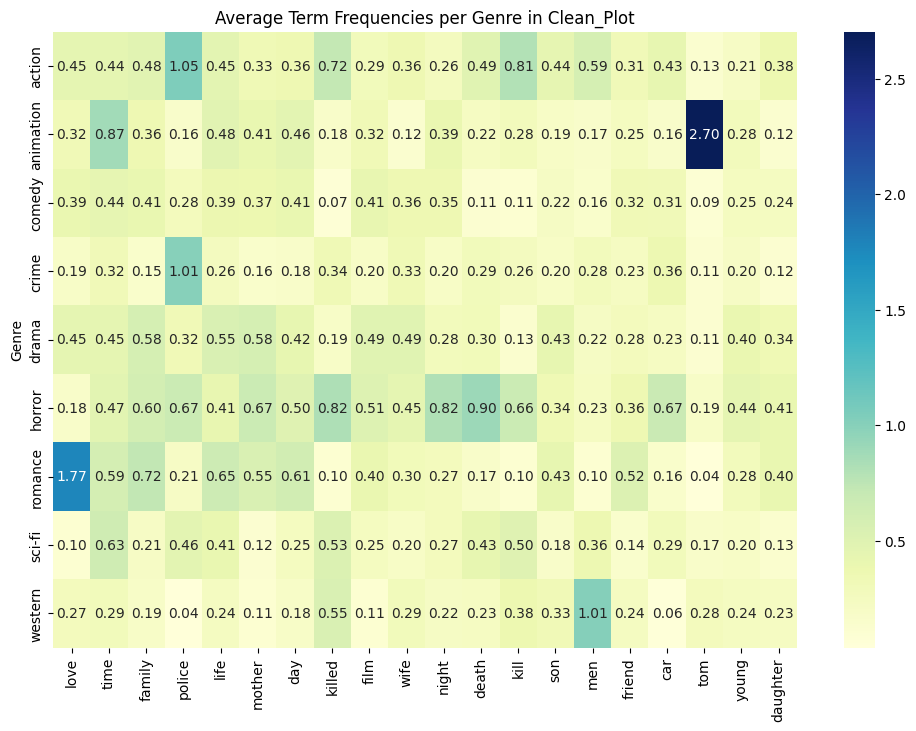

In [13]:
def term_frequency_heatmap(key):
    
    vectorizer = CountVectorizer(stop_words=stop_words, max_features=1000)
    dtm = vectorizer.fit_transform(data[key])
    dtm_df = pd.DataFrame(dtm.toarray(), columns=vectorizer.get_feature_names_out())

    genre_term_freq = dtm_df.groupby(data['Genre']).mean()

    top_words = dtm_df.sum().nlargest(20).index
    genre_term_freq_top = genre_term_freq[top_words]

    plt.figure(figsize=(12,8))
    sns.heatmap(genre_term_freq_top, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f'Average Term Frequencies per Genre in {key}')
    plt.show()
    
term_frequency_heatmap('Clean_Plot')

## Sentiment Analysis
Takes a bit more than the rest to run

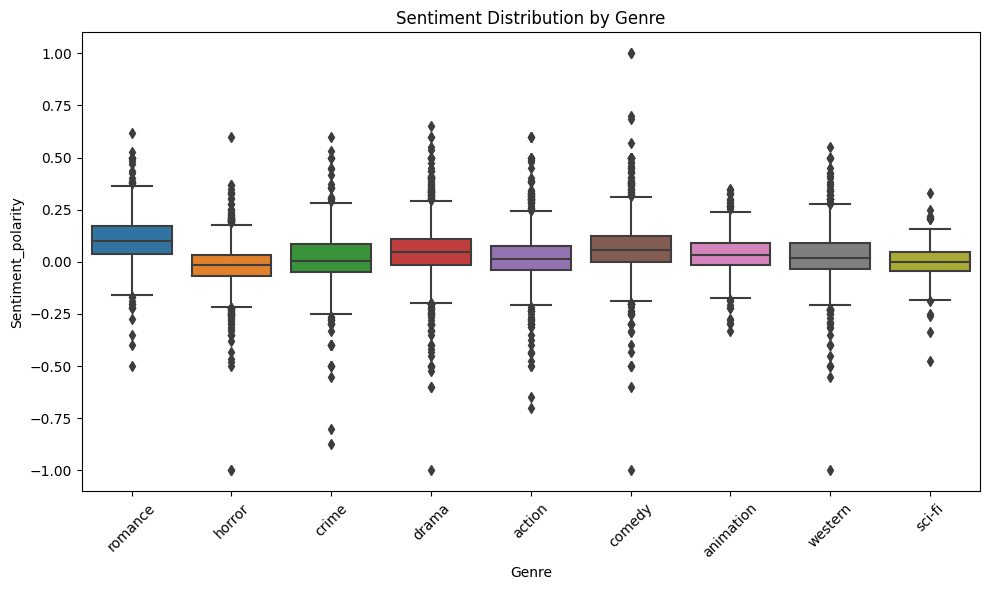

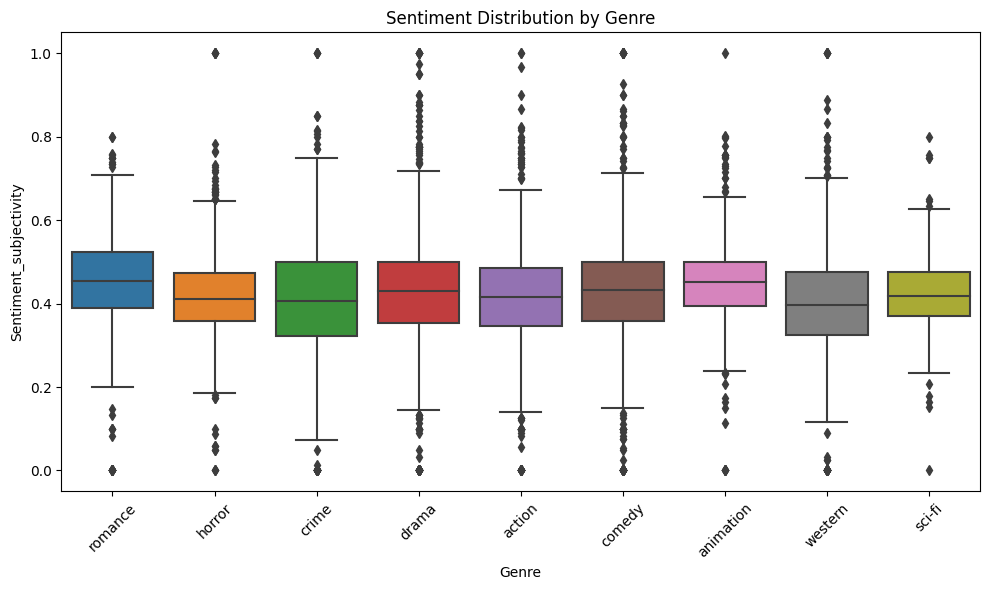

In [14]:
from textblob import TextBlob
from scipy.sparse import hstack
from sklearn.metrics import classification_report, confusion_matrix

def get_sentiment_polarity(text):
    return TextBlob(text).sentiment.polarity
def get_sentiment_subjectivity(text):
    return TextBlob(text).sentiment.subjectivity

data['Sentiment_polarity'] = data['Plot'].apply(get_sentiment_polarity)
data['Sentiment_subjectivity'] = data['Plot'].apply(get_sentiment_subjectivity)

def plot_sentiment_by_genre(modifier):
    plt.figure(figsize=(10, 6))
    
    sns.boxplot(x='Genre', y=modifier, data=data)
    
    plt.title('Sentiment Distribution by Genre')
    plt.xlabel('Genre')
    plt.ylabel(modifier)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_sentiment_by_genre('Sentiment_polarity')
plot_sentiment_by_genre('Sentiment_subjectivity')

## Experimental Section

In [15]:
# NAMED ENTITY COUNTS
#import spacy
#
#nlp = spacy.load('en_core_web_sm')
#
#def count_entities(text):
#    doc = nlp(text)
#    return len(doc.ents)
#
#data['Entity_Count'] = data['Plot'].apply(count_entities)

In [16]:
# POS TAGGING
#def pos_counts(text):
#    doc = nlp(text)
#    pos_counts = doc.count_by(spacy.attrs.POS)
#    return pos_counts
#
#data['POS_Counts'] = data['Plot'].apply(pos_counts)

# BERT Section

## Pip installs we needed to perform for BERT

In [17]:
#!pip install transformers
#!pip install torch

## Imports

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score
import torch
from transformers import DistilBertTokenizer, DataCollatorWithPadding
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import LabelEncoder
from transformers import get_linear_schedule_with_warmup

## Training data reading and preprocessing

In [19]:
data = pd.read_csv('/kaggle/input/train-set/train.txt', sep='\t', header=None, names=['Title', 'Origin', 'Genre', 'Director', 'Plot'])
print("Genre value counts")
print(data['Genre'].value_counts())

Genre value counts
Genre
drama        1676
comedy       1193
horror       1108
action       1059
romance       886
western       829
crime         541
animation     535
sci-fi        214
Name: count, dtype: int64


In [20]:
def preprocess_text(text):
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return text

data['Clean_Plot'] = data['Plot'].apply(preprocess_text)

In [21]:
# make sure the output is "Using device: cuda" for your own sake!!!
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using device: {device}")

Using device: cpu


## Encode and train-test split

In [22]:
encoder = LabelEncoder()
data['GenreEncoded'] = encoder.fit_transform(data['Genre'])

X_train, X_test, y_train, y_test = train_test_split(
    data['Clean_Plot'], data['GenreEncoded'], 
    test_size=0.2, 
    random_state=42, 
    stratify=data['GenreEncoded']
)
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)
print("done")

done


In [23]:
# # Custom Dataset altered to deal with my idea for the chunking strategy, but that didn't go well -- Future Work

# class MovieGenreDataset(torch.utils.data.Dataset):
#     def __init__(self, encodings, labels, plot_indices):
#         self.encodings = encodings
#         self.labels = labels
#         self.plot_indices = plot_indices

#     def __getitem__(self, idx):
#         item = {key: val[idx] for key, val in self.encodings.items()}
#         # No need to add labels here if using Trainer with labels in encodings
#         return item

#     def __len__(self):
#         return len(self.encodings['input_ids'])


In [ ]:
# ## OLD VERSION -- simply truncates plots with more than 512 tokens, leaving them with 512 tokens

tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

def tokenize_data(texts, max_length=512):
    return tokenizer(
       texts.tolist(),
       padding=True,
       truncation=True,
       max_length=max_length,
       return_tensors='pt'
   )

train_encodings = tokenize_data(X_train)
test_encodings = tokenize_data(X_test)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

## Custom Dataset Class

In [ ]:
class MovieGenreDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MovieGenreDataset(train_encodings, y_train)
test_dataset = MovieGenreDataset(test_encodings, y_test)

## Useful to see how many plots exceed 512 tokens

In [ ]:
# tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# def count_tokens(texts, tokenizer):
#     token_counts = []
#     for text in texts:
#         tokens = tokenizer.encode(text, truncation=False)  # No truncation to check full token count
#         token_counts.append(len(tokens))
#     return token_counts

# token_counts = count_tokens(data['Clean_Plot'].tolist(), tokenizer)
# over_512_count = sum([1 for count in token_counts if count > 512])

# print(f"Number of plots exceeding 512 tokens: {over_512_count}")

In [ ]:
# # EXPERIMENT -- DIDN'T GO WELL

# tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

# def chunk_text(text, max_length=512):
#     words = text.split()
#     return [' '.join(words[i:i + max_length]) for i in range(0, len(words), max_length)]

# def tokenize_chunked_data(texts, labels, max_length=512):
#     all_chunks = []
#     all_labels = []
#     for i, text in enumerate(texts):
#         chunks = chunk_text(text, max_length)
#         all_chunks.extend(chunks)
#         if labels is not None:
#             all_labels.extend([labels[i]] * len(chunks))
#     encodings = tokenizer(all_chunks, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
#     return encodings, all_labels

# train_encodings, train_labels = tokenize_chunked_data(X_train, y_train)
# test_encodings, test_labels = tokenize_chunked_data(X_test, y_test)

In [ ]:
# Experimental version where I tried to actually implement the version that I had envisioned but this didn't go well at all -- Future Work

# def chunk_text(text, tokenizer, max_length=512, stride=0):
#     tokens = tokenizer.encode(text, add_special_tokens=False)
#     # Split tokens into chunks with optional stride
#     chunks = []
#     for i in range(0, len(tokens), max_length - stride):
#         chunk = tokens[i:i + max_length]
#         chunks.append(chunk)
#     return chunks


# def tokenize_chunked_data(texts, labels, tokenizer, max_length=512, stride=0):
#     all_input_ids = []
#     all_attention_masks = []
#     all_labels = []
#     for i, text in enumerate(texts):
#         chunks = chunk_text(text, tokenizer, max_length=max_length, stride=stride)
#         for chunk in chunks:
#             # prepare inputs for model
#             inputs = tokenizer.prepare_for_model(
#                 chunk,
#                 max_length=max_length,
#                 padding='max_length',
#                 truncation=True,
#                 return_tensors='pt'
#             )
#             all_input_ids.append(inputs['input_ids'])
#             all_attention_masks.append(inputs['attention_mask'])
#             if labels is not None:
#                 all_labels.append(labels[i])
#     # torch.cat concatenates tensors
#     all_input_ids = torch.cat(all_input_ids, dim=0)
#     all_attention_masks = torch.cat(all_attention_masks, dim=0)
#     return {'input_ids': all_input_ids, 'attention_mask': all_attention_masks}, all_labels


In [ ]:
# print(len(train_encodings['input_ids']), len(train_labels))
# print(len(test_encodings['input_ids']), len(test_labels))

# assert len(train_encodings['input_ids']) == len(train_labels), "Mismatch between encodings and labels"
# assert len(test_encodings['input_ids']) == len(test_labels), "Mismatch between encodings and labels"

In [ ]:
# input_ids = train_encodings['input_ids'][0].tolist()
# tokens = tokenizer.convert_ids_to_tokens(input_ids)
# print(tokens)

## Import Pre-Trained Model

In [ ]:
from transformers import DistilBertForSequenceClassification
model = (DistilBertForSequenceClassification
        .from_pretrained('distilbert-base-uncased', num_labels=len(encoder.classes_))
        .to(device))

## Custom Metrics function

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, f1_score

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')
    print(f"Accuracy: {acc}, F1-score: {f1}")
    return {'accuracy': acc, 'f1': f1}

## Training (Fine-Tuning)

In [ ]:
from transformers import Trainer, TrainingArguments

from transformers import DataCollatorWithPadding

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# parameters such as learning rate, batch size and weight decay were experimented a lot
training_args = TrainingArguments(
    output_dir='./results',
    eval_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=3, # we tested with more than 3 epochs but it didn't improve the results
    weight_decay=0.01,
    logging_steps=100,
    logging_dir='./logs',
    report_to="none" # supress annoying warning
)

# parameters for training (fine-tuning)
trainer = Trainer(
    model=model, # pre-trained distilBert
    args=training_args, # custom training args
    train_dataset=train_dataset, # custom datasets (this one and test)
    eval_dataset=test_dataset, 
    compute_metrics=compute_metrics,
    data_collator=data_collator,
)

# actual fine-tuning of the model we feed it
trainer.train()

## Saves the model

In [ ]:
# IF YOU WANT TO SAVE THE MODEL IN KAGGLE
# model.save_pretrained('./modelName')
# tokenizer.save_pretrained('./modelName')

## Evaluation Metrics (Accuracy, F1)

In [ ]:
eval_result = trainer.evaluate()
predictions_output = trainer.predict(test_dataset)
predicted_labels = np.argmax(predictions_output.predictions, axis=-1)
true_labels = y_test.values
print(f"Evaluation Results: {eval_result}")

In [ ]:
# Per-genre metrics
from sklearn.metrics import classification_report
report = classification_report(true_labels, predicted_labels, target_names=encoder.classes_)
print("Classification Report:")
print(report)

## Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confusion_matrix = confusion_matrix(true_labels, predicted_labels)
display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=encoder.classes_)
display.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix")
plt.xticks(rotation=45, ha='right')
plt.show()

## Manually Analyze Misclassifications and save them to a file

In [ ]:
misclassified_indices = np.where(predicted_labels != true_labels)[0]

# # displays first 10 misclassified examples to analyze in the console
# for idx in misclassified_indices[:10]:
#     print(f"True label: {encoder.inverse_transform([true_labels[idx]])[0]}, Predicted: {encoder.inverse_transform([predicted_labels[idx]])[0]}")
#     print(f"Text: {X_test.iloc[idx]}")
#     print("-" * 50)

# saves mispredictions to a file to manually analyze them for the report
with open('./misclassified_plots.txt', 'w') as f:
    f.write("Misclassified Plots:\n")
    f.write("="*80 + "\n")
    for idx in misclassified_indices:
        true_label = encoder.inverse_transform([true_labels[idx]])[0]
        predicted_label = encoder.inverse_transform([predicted_labels[idx]])[0]
        plot_text = X_test.iloc[idx]
        f.write(f"True label: {true_label}, Predicted: {predicted_label}\n")
        f.write(f"Plot: {plot_text}\n")
        f.write("-" * 80 + "\n")

print("Done Writing")

In [ ]:
#print(misclassified_indices.shape, X_test.shape, 1 - len(misclassified_indices)/len(X_test))

# Testing Time (Run the BERT Import cell at the start of the section first)

It's essentially the same as above but we use the whole plot instead of performing a split, but I want to make the whole process clear

## Read and Preprocess the Training Dataset

In [ ]:
test_data = pd.read_csv('/kaggle/input/test-set/test_no_labels.txt', 
                        sep='\t', header=None, names=['Title', 'Origin', 'Director', 'Plot'])

test_data.head()

In [ ]:
test_data['Clean_Plot'] = test_data['Plot'].apply(preprocess_text)

test_encodings = tokenize_data(test_data['Clean_Plot'])

## X_train and y_train on the whole plot

In [ ]:
encoder = LabelEncoder()
train_data['GenreEncoded'] = encoder.fit_transform(train_data['Genre'])

X_train, y_train = train_data['Clean_Plot'], train_data['GenreEncoded']

## Tokenize the training data and import model

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using device: {device}")

In [ ]:
from transformers import DistilBertForSequenceClassification

model = DistilBertForSequenceClassification.from_pretrained(
    'distilbert-base-uncased', 
    num_labels=len(encoder.classes_)
).to(device)

tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

def tokenize_data(texts, max_length=512):
    return tokenizer(
       texts.tolist(),
       padding=True,
       truncation=True,
       max_length=max_length,
       return_tensors='pt'
   )

train_encodings = tokenize_data(X_train)

In [ ]:
X_train.shape

## Encode the dataset

In [ ]:
class MovieGenreDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.long)
        return item

    def __len__(self):
        return len(self.labels)
    
def tokenize_data(texts, max_length=512):
    return tokenizer(
       texts.tolist(),
       padding=True,
       truncation=True,
       max_length=max_length,
       return_tensors='pt'
   )

train_dataset = MovieGenreDataset(train_encodings, y_train)

## Training on the whole plot

In [ ]:
from transformers import DistilBertForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=len(encoder.classes_)).to(device)
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

training_args = TrainingArguments(
    output_dir='./model_testing',
    eval_strategy="no", # don't forget to not evaluate
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    num_train_epochs=3,
    weight_decay=0.01,
    logging_steps=100,
    logging_dir='./logs',
    report_to="none"
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    data_collator=data_collator,
)

trainer.train()

In [ ]:
test_data['Clean_Plot'] = test_data['Plot'].apply(preprocess_text)

test_encodings = tokenize_data(test_data['Clean_Plot'])

## Custom Testing Dataset

## Load the Model and Tokenizer

In [ ]:
class MovieGenreTestDataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        return item

    def __len__(self):
        return len(self.encodings['input_ids'])


test_dataset = MovieGenreTestDataset(test_encodings)

## Perform the predictions

In [ ]:
model.eval() # puts the model in evaluation mode, instead of training

predictions_output = trainer.predict(test_dataset)
predicted_labels = np.argmax(predictions_output.predictions, axis=-1)

predicted_genres = encoder.inverse_transform(predicted_labels)

## Writes them to a File

In [ ]:
# uncomment for safety
#assert len(predicted_genres) == len(test_data), "Number of predictions does not match number of plots"

with open('predicted_genres2.txt', 'w', encoding='utf-8') as f:
    for genre in predicted_genres:
        f.write(f"{genre}\n")

# don't forget to manually remove the last \n !!!!